In [25]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import math
import random
import pymulticonsensus
from utils import download_datasets, load_data, misclassification, model_type, get_soft_assignment, draw_soft_assignment, draw_labeling
from time import time

In [26]:
# Load data from all scenes in the dataset
dataset = "adelaideF"
url_base = 'https://n.ethz.ch/~dbarath/data/'

# Downloading the datasets used for the evaluation if needed
download_datasets(url_base, [dataset])

# Loading the scenes from the downloaded dataset
data = load_data(dataset)

In [27]:
#Now, some visualization from OpenCV tutorial
#https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_feature2d/py_feature_homography/py_feature_homography.html
#We will draw correspondences found and the geometric transformation between the images.
from copy import deepcopy
def decolorize(img):
    return  cv2.cvtColor(cv2.cvtColor(img,cv2.COLOR_RGB2GRAY), cv2.COLOR_GRAY2RGB)

def draw_matches(kps1, kps2, tentatives, img1, img2, mask, color):    
    matchesMask = mask.ravel().tolist()
    
    # Blue is estimated, green is ground truth homography
    draw_params = dict(matchColor = color, # draw matches in yellow color
                   singlePointColor = None,
                   matchesMask = matchesMask, # draw only inliers
                   flags = 2)
    img_out = cv2.drawMatches(decolorize(img1),kps1,decolorize(img2),kps2,tentatives,None,**draw_params)
    plt.figure(figsize = (12,8))
    plt.imshow(cv2.cvtColor(img_out, cv2.COLOR_BGR2RGB))
    plt.show() 
    return 

def random_color(label = None):
    if label is not None:
        if label == 0:
            return (255, 0, 0)
        elif label == 1:
            return (0, 255, 0)
        elif label == 2:
            return (0, 0, 255)
    return (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))

In [28]:
def process_scene(path, scene, correspondences, ref_labeling, inlier_threshold, visualize = True):
    # Load the images
    img1 = cv2.cvtColor(cv2.imread(f"{path}/{scene}/{scene}1.png"), cv2.COLOR_BGR2RGB)
    img2 = cv2.cvtColor(cv2.imread(f"{path}/{scene}/{scene}2.png"), cv2.COLOR_BGR2RGB)
    
    start = time()
    motions = pymulticonsensus.findTwoViewMotions(
        np.ascontiguousarray(correspondences), 
        img1.shape[1], img1.shape[0], 
        img2.shape[1], img2.shape[0],
        threshold = inlier_threshold,
        confidence = 0.999,
        neighborhood_ball_radius = 50.0,
        maximum_tanimoto_similarity = 0.85,
        starting_hypothesis_number = 10,
        added_hypothesis_number = 10,
        max_iters = 75,
        minimum_point_number = 14,
        minimum_component_distance = 50,
        maximum_component_distance = 100,
        component_partition = 10,
        sampler_id = 2) 
    end = time()
    total_time = end - start
    print(f"Run-time = {total_time:.3f} seconds")

    # Get the soft assignment and draw it.
    motions = np.array(motions)
    model_number = int(motions.shape[0] / 3)
    print(f"Model number = {model_number}")

    # Get hard labeling by a energy-based labeling of PEARL
    labeling = pymulticonsensus.getLabeling(
	    motions.reshape(model_number, 9),
	    correspondences,
	    model_type("two_view_motion"),
	    inlier_threshold,
        50.0,
        0.1,
        14.0)
        
    misclassification_error = misclassification(labeling + 1, ref_labeling)   
    print(f"Misclassification error = {misclassification_error:.3f}")

    # The estimator returns -1 as the outlier class.
    # In the drawing function, the outlier label is <model #> + 1
    mask = labeling == -1
    labeling[mask] = model_number
 
    # Draw the results
    if visualize:
        soft_assignment = pymulticonsensus.getSoftLabeling(
            motions.reshape(model_number, 9),
            correspondences,
            model_type("two_view_motion"),
            inlier_threshold)
        
        draw_soft_assignment(img1, img2, soft_assignment, correspondences, radius=6, figsize=(18,12))
        draw_labeling(img1, img2, labeling, correspondences, radius=6, figsize=(18,12))

    return misclassification_error, total_time

Processing scene 'game'
Run-time = 0.018 seconds
Model number = 2
Misclassification error = 0.039


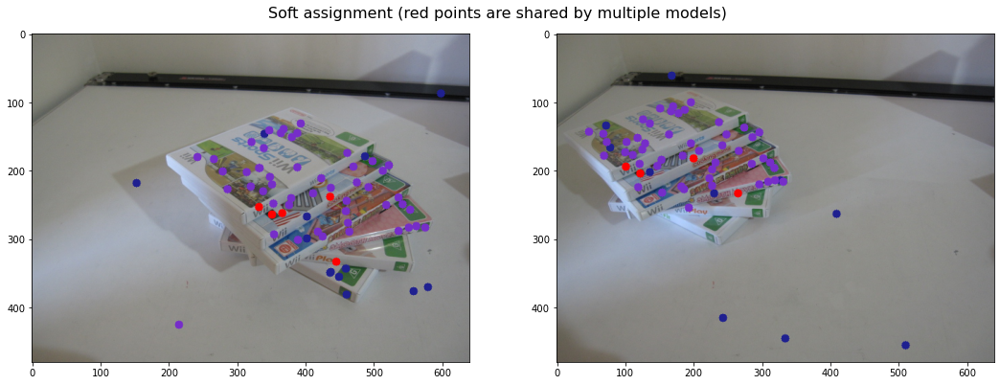

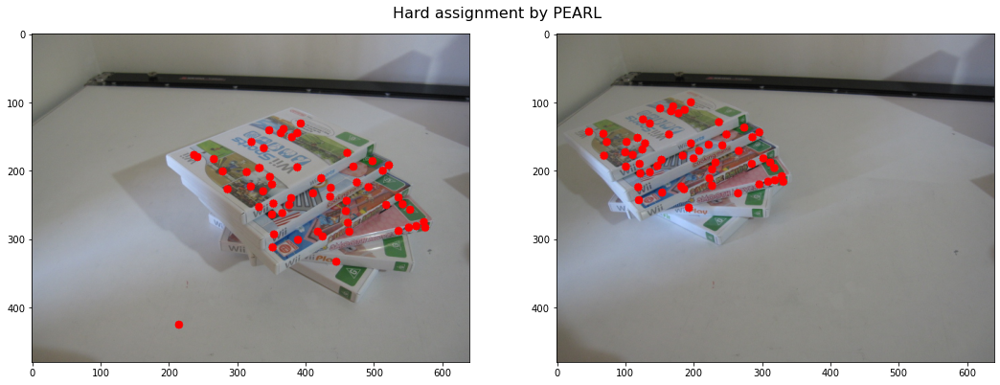

Processing scene 'breadtoycar'
Run-time = 0.017 seconds
Model number = 3
Misclassification error = 0.072


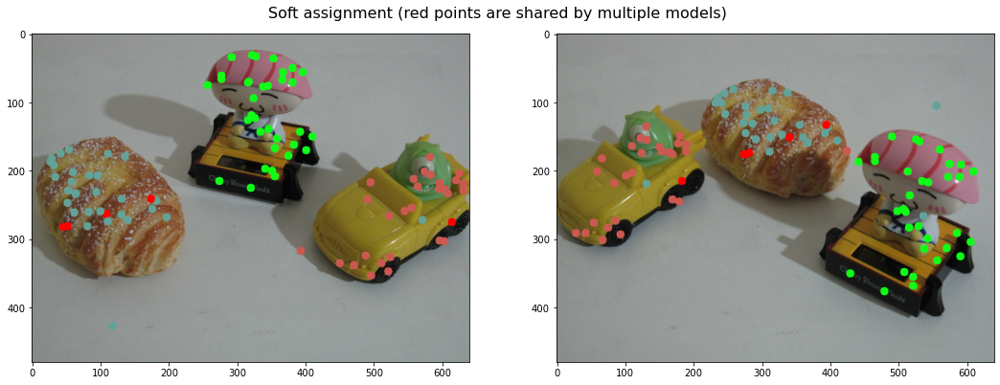

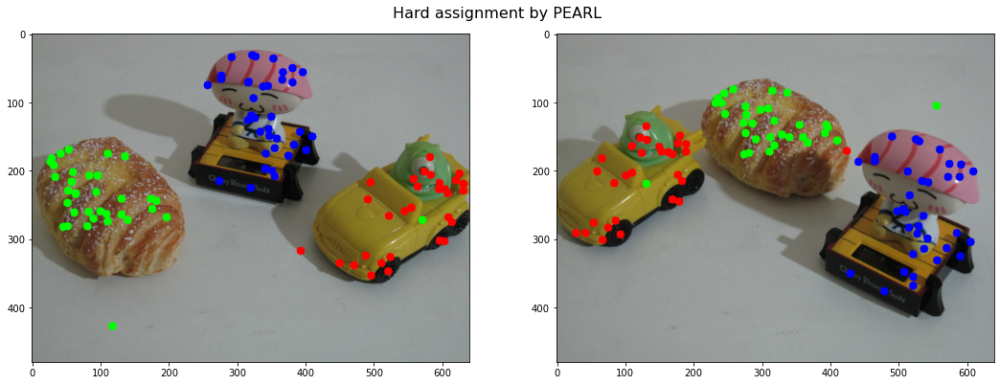

Processing scene 'breadcube'
Run-time = 0.021 seconds
Model number = 2
Misclassification error = 0.025


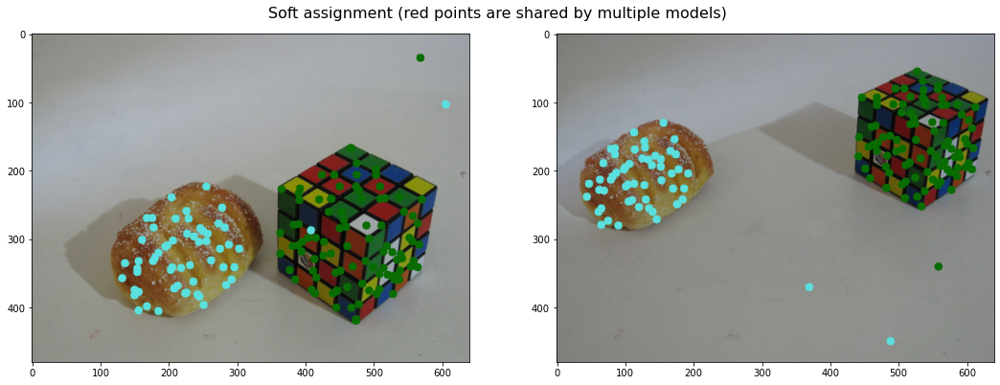

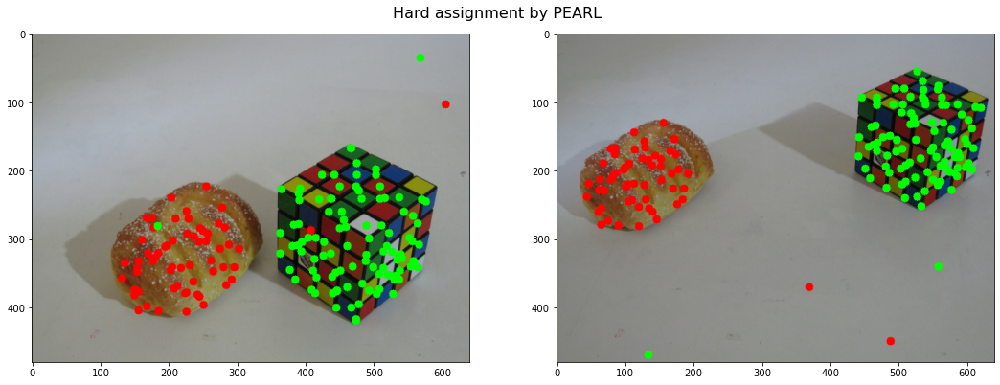

Processing scene 'biscuitbookbox'
Run-time = 0.026 seconds
Model number = 3
Misclassification error = 0.019


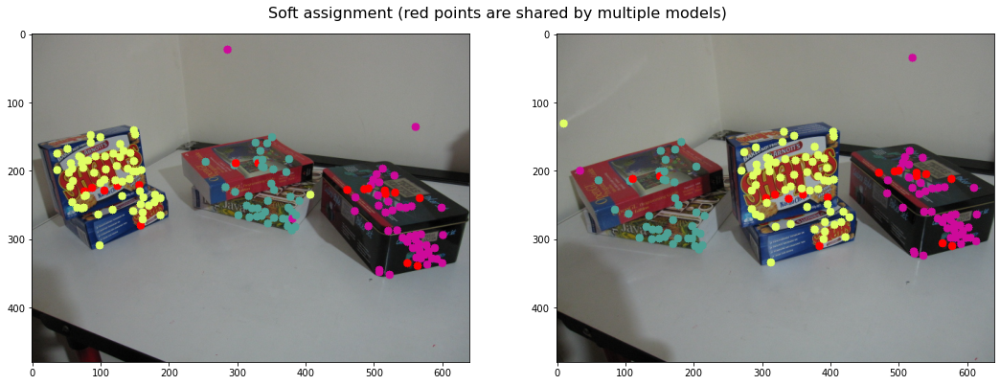

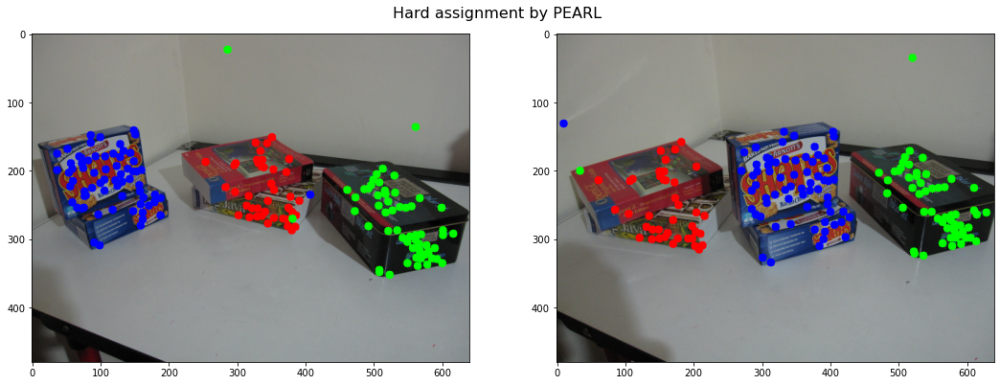

Processing scene 'cubetoy'
Run-time = 0.020 seconds
Model number = 2
Misclassification error = 0.028


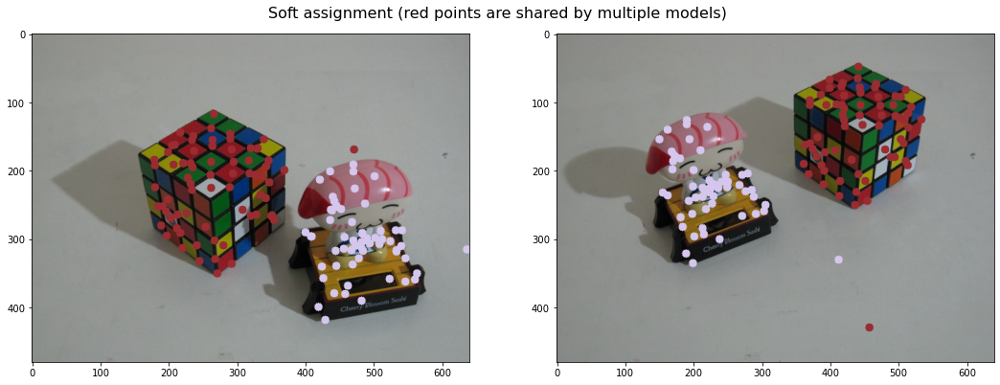

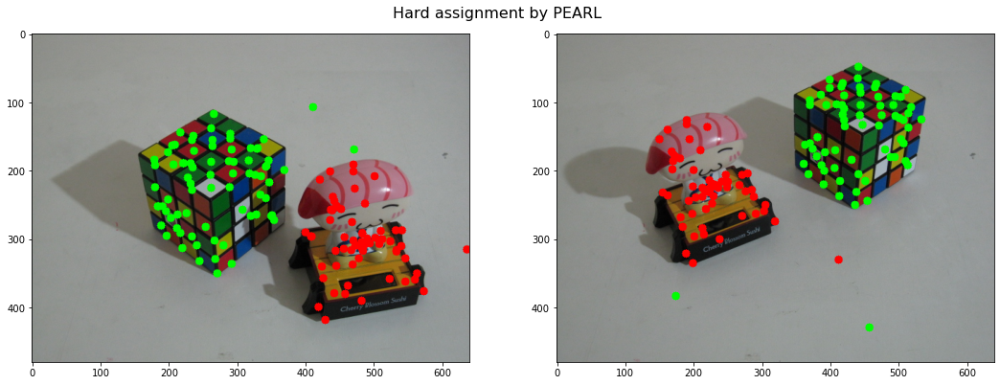

Processing scene 'cubechips'
Run-time = 0.022 seconds
Model number = 2
Misclassification error = 0.032


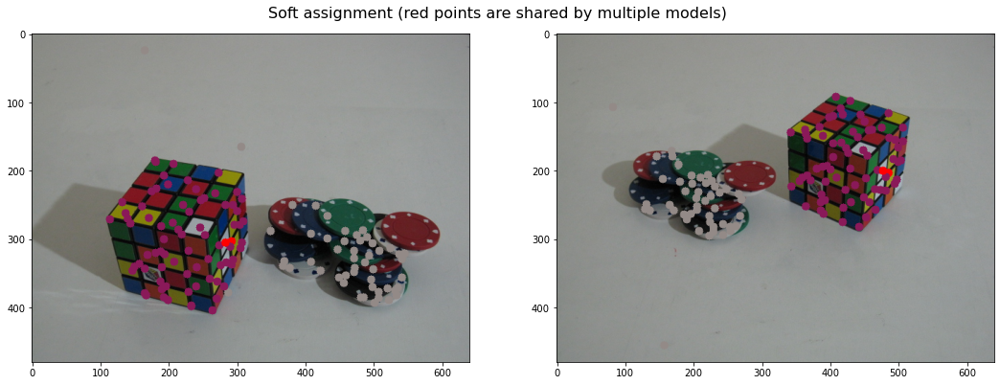

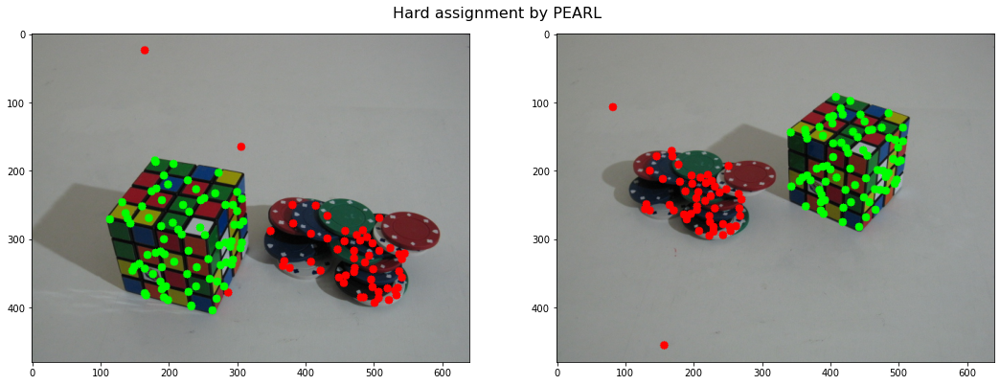

Processing scene 'dinobooks'
Run-time = 0.031 seconds
Model number = 3
Misclassification error = 0.156


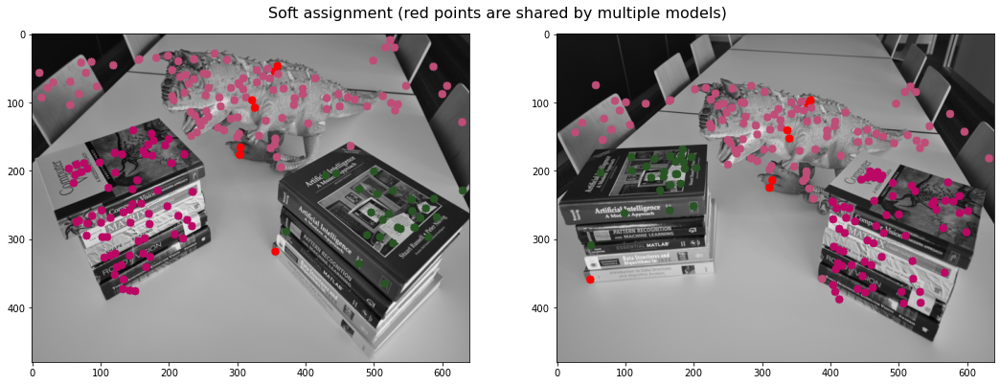

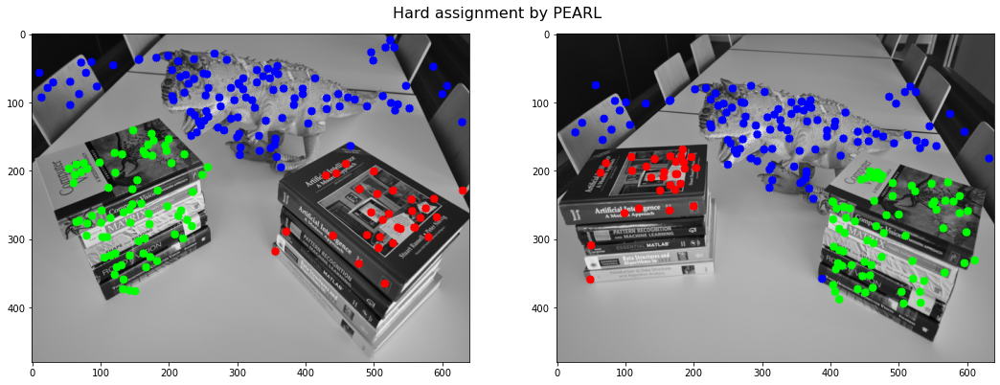

Processing scene 'breadcartoychips'
Run-time = 0.024 seconds
Model number = 4
Misclassification error = 0.072


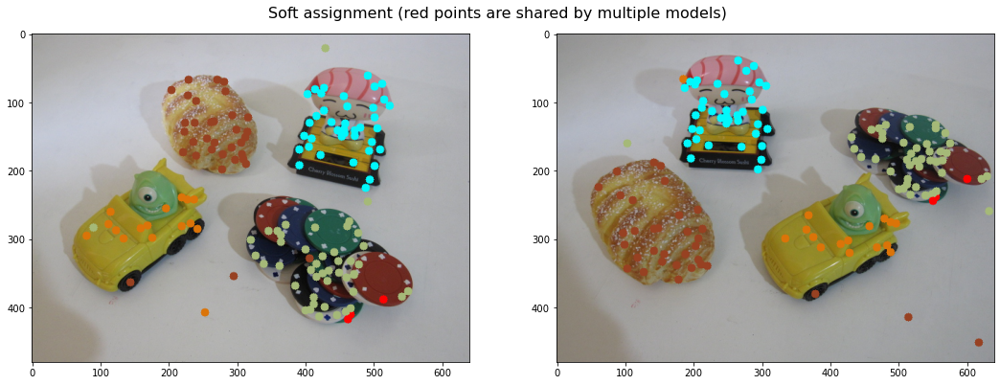

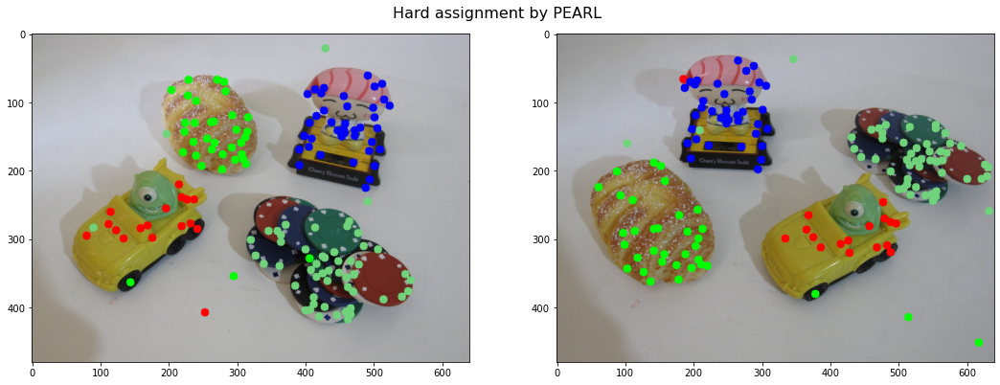

Processing scene 'boardgame'
Run-time = 0.027 seconds
Model number = 3
Misclassification error = 0.111


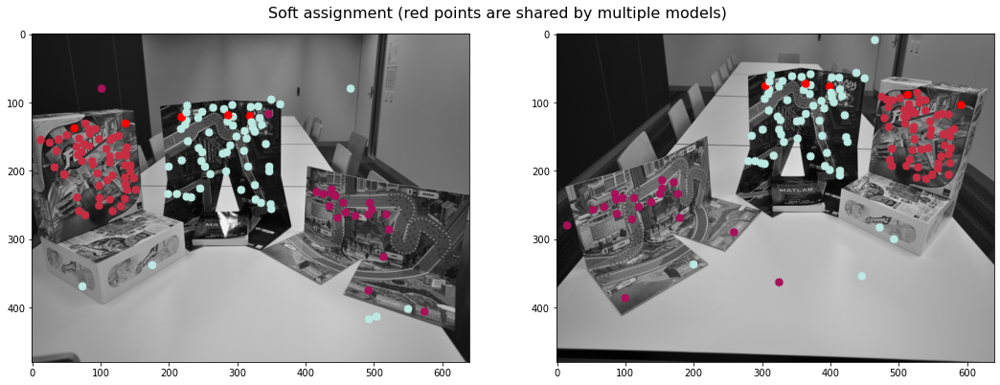

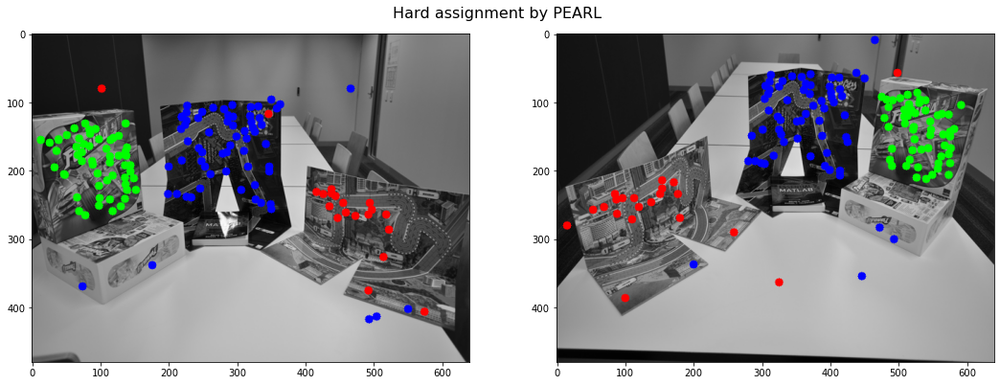

Processing scene 'book'
Run-time = 0.015 seconds
Model number = 1
Misclassification error = 0.005


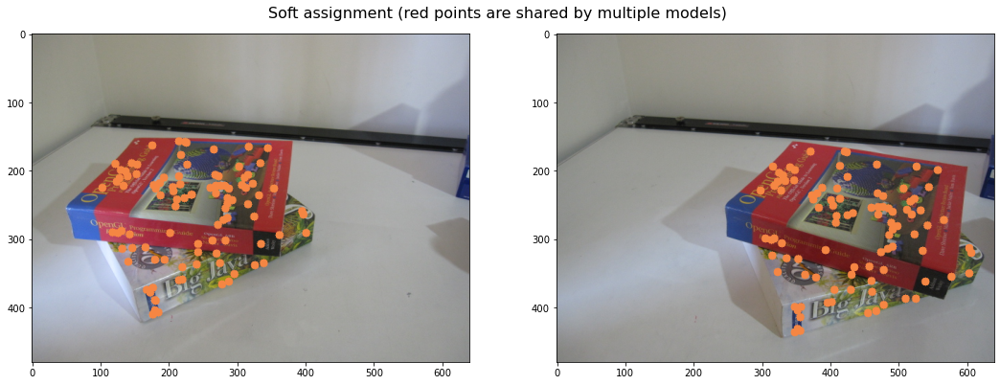

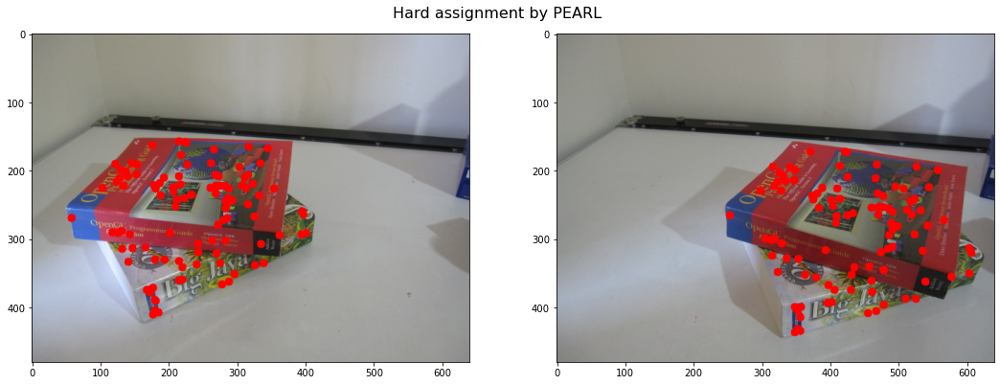

Processing scene 'gamebiscuit'
Run-time = 0.026 seconds
Model number = 2
Misclassification error = 0.021


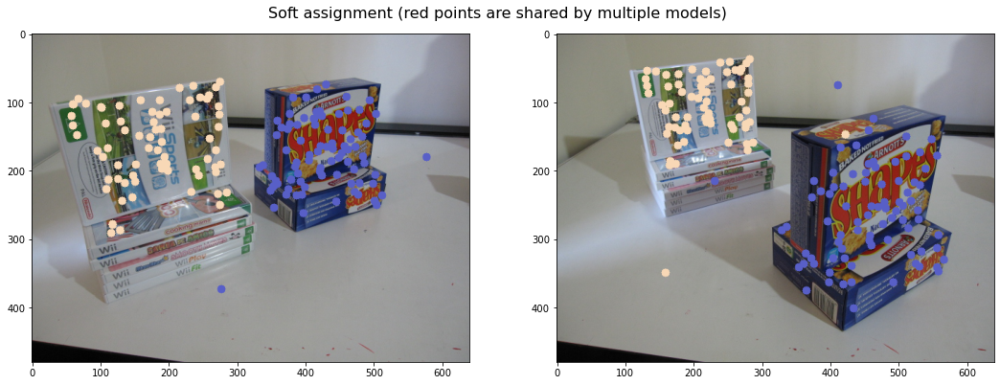

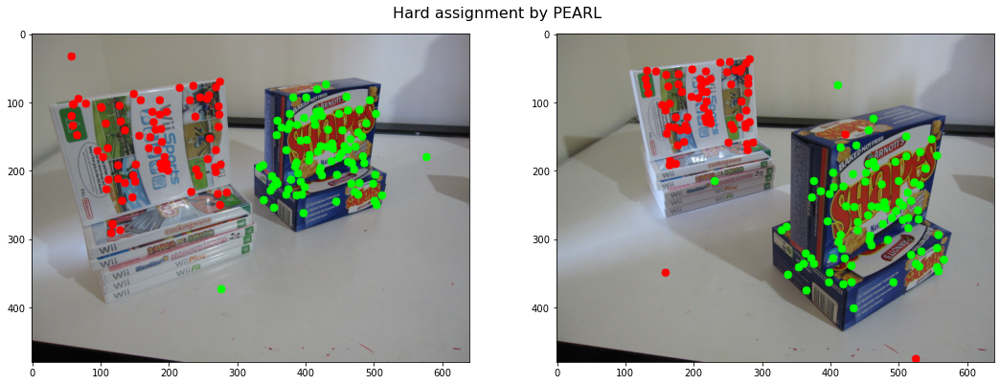

Processing scene 'biscuit'
Run-time = 0.025 seconds
Model number = 1
Misclassification error = 0.012


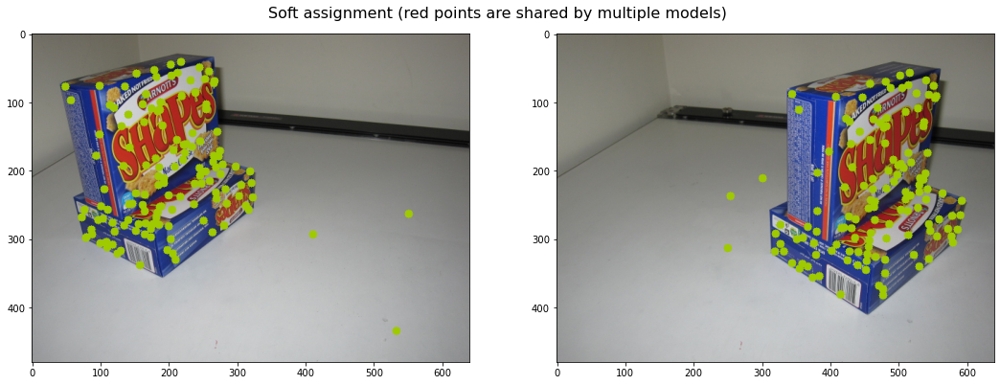

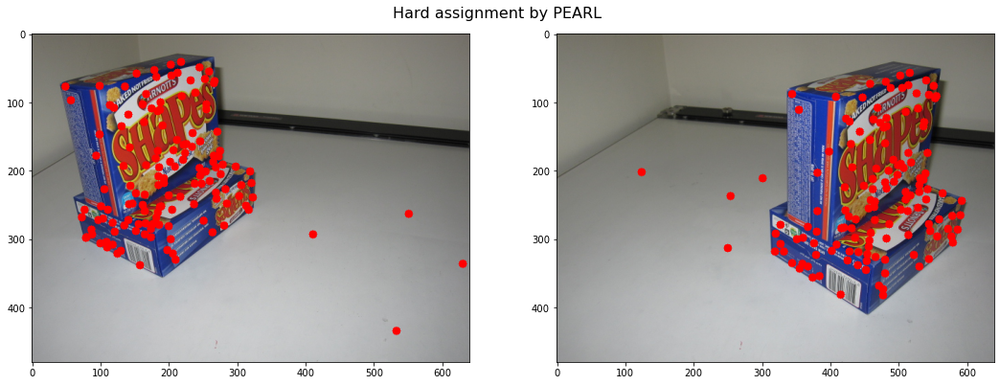

Processing scene 'cubebreadtoychips'
Run-time = 0.034 seconds
Model number = 4
Misclassification error = 0.024


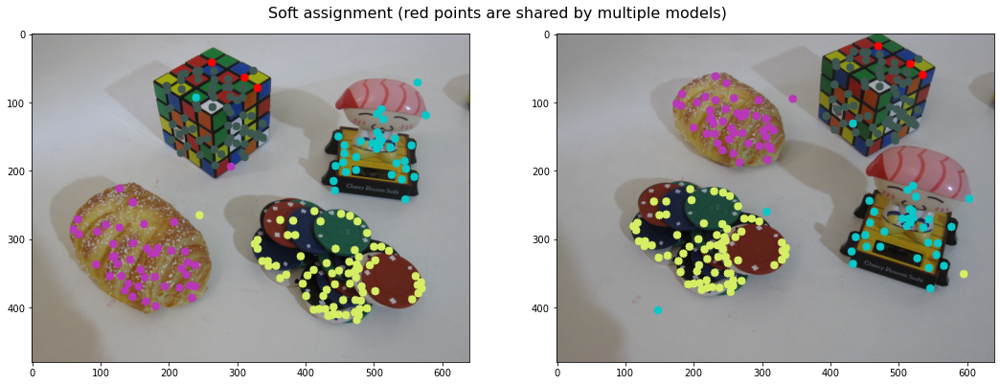

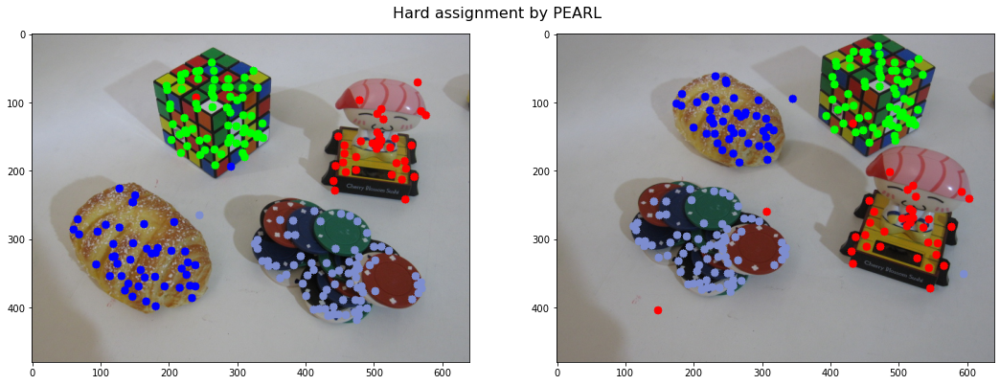

Processing scene 'breadtoy'
Run-time = 0.024 seconds
Model number = 2
Misclassification error = 0.024


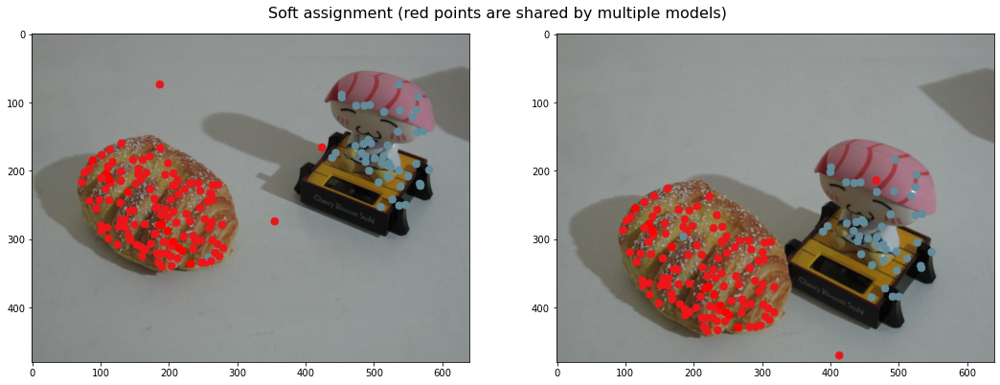

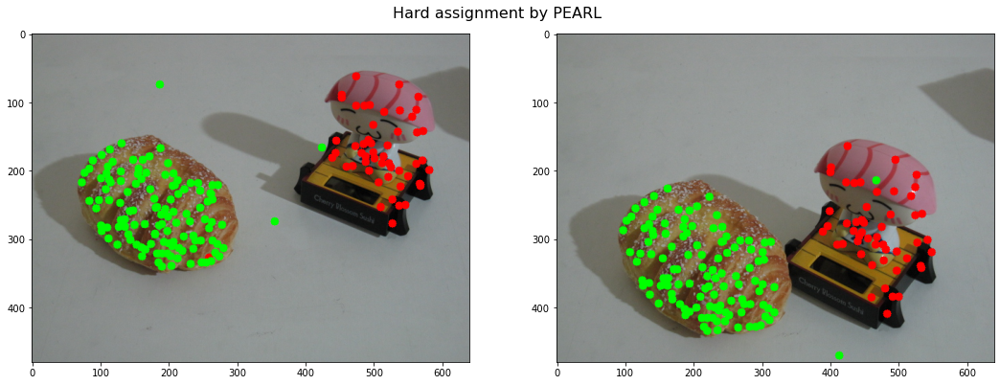

Processing scene 'cube'
Run-time = 0.018 seconds
Model number = 1
Misclassification error = 0.017


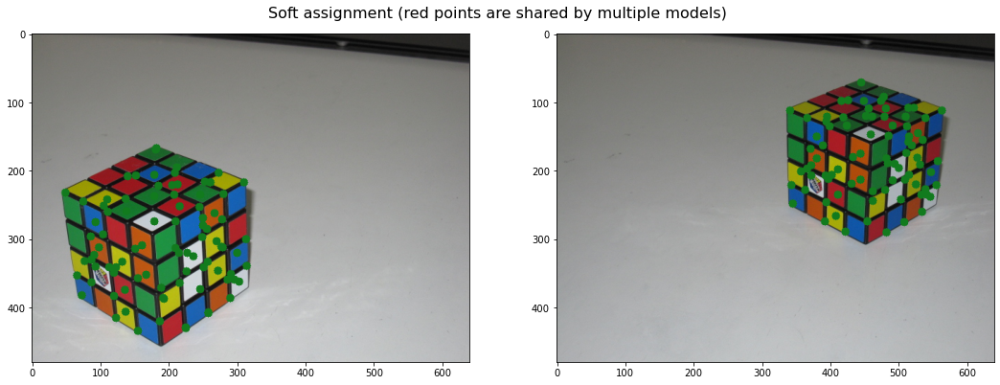

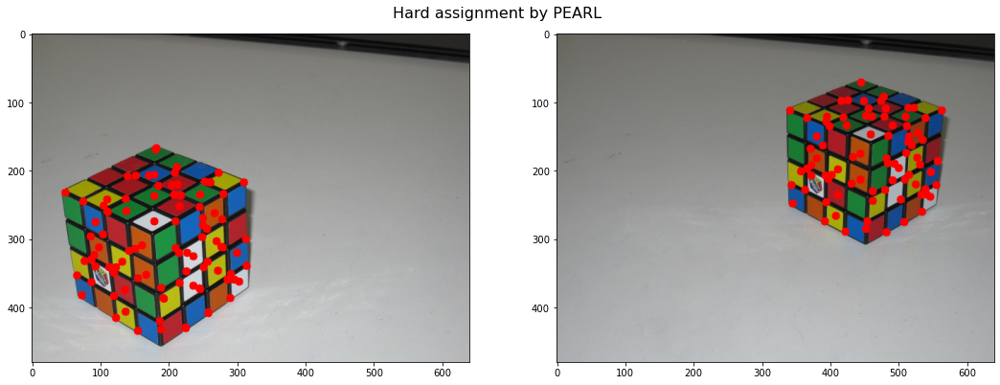

Processing scene 'breadcubechips'
Run-time = 0.023 seconds
Model number = 3
Misclassification error = 0.017


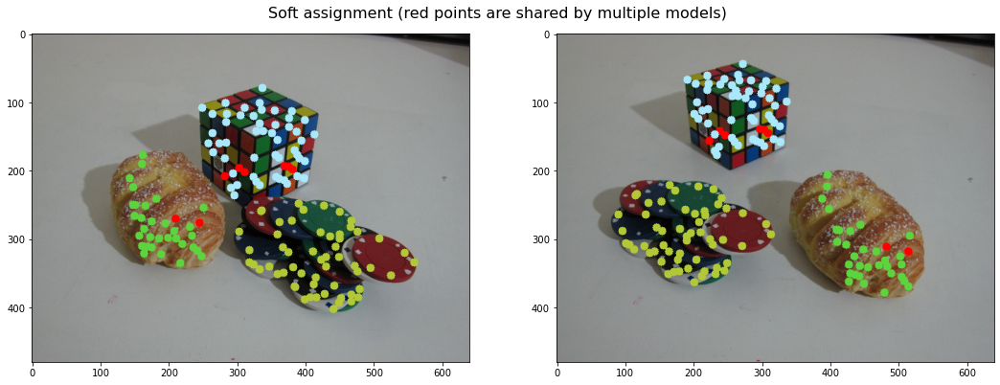

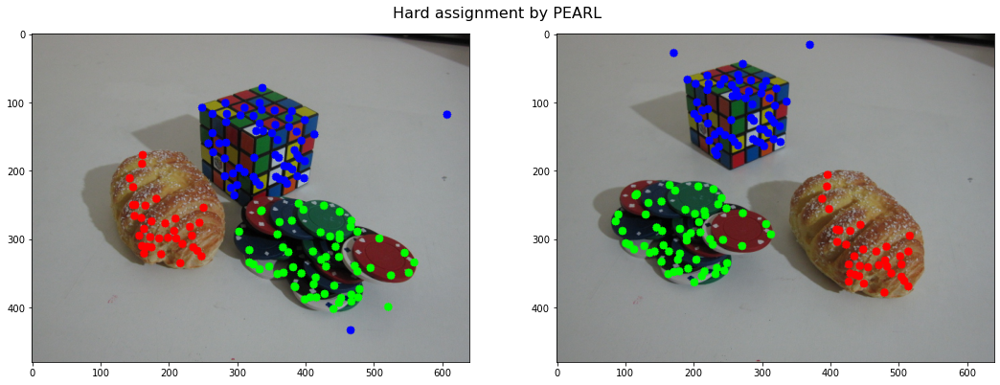

Processing scene 'toycubecar'
Run-time = 0.021 seconds
Model number = 3
Misclassification error = 0.145


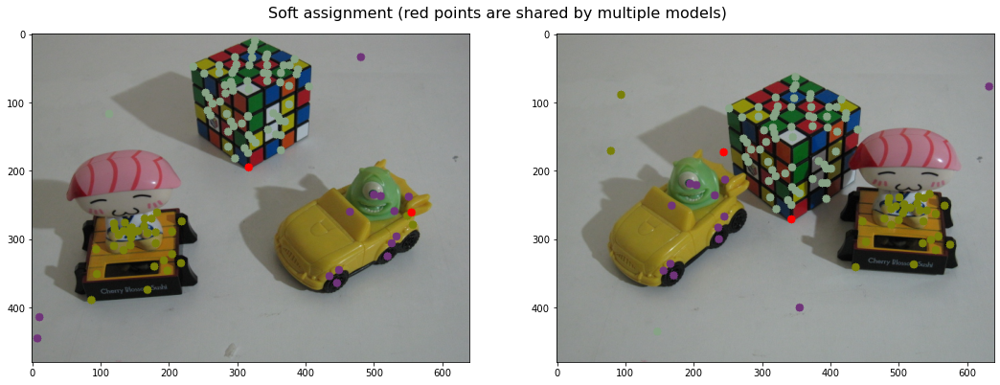

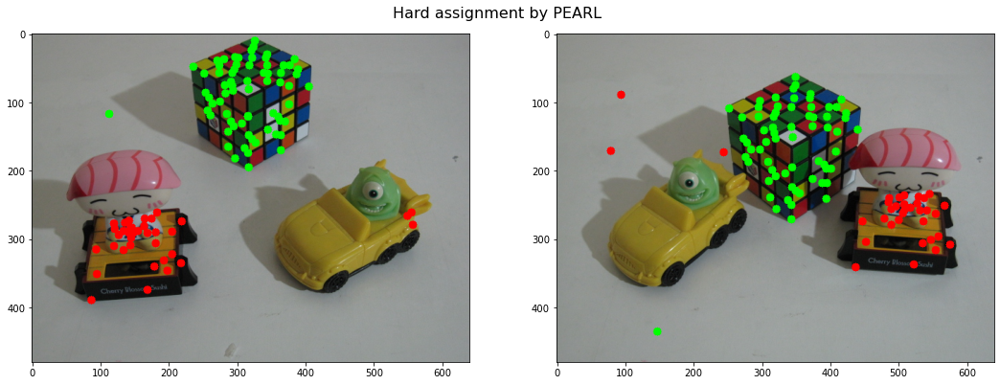

Processing scene 'carchipscube'
Run-time = 0.019 seconds
Model number = 3
Misclassification error = 0.042


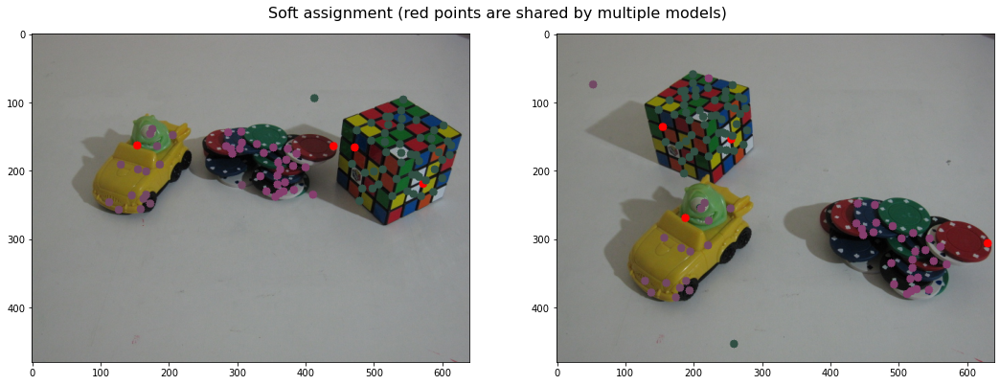

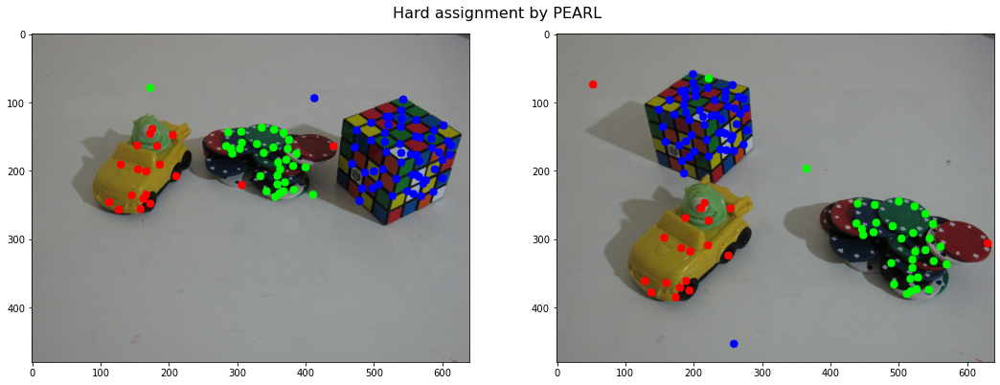

In [29]:
MEs = []
times = []
for scene in data:
    print(f"Processing scene '{scene}'")
    misclassification_error, processing_time = process_scene(f"{dataset}", scene, data[scene]['corrs'], data[scene]['labels'], 1.9)
    MEs.append(misclassification_error)
    times.append(processing_time)

In [33]:
print(f"Average misclassification error on the AdelaideF dataset = {np.mean(MEs):.3f} (+/- {np.std(MEs):.3f})")
print(f"Average run-time on the AdelaideF dataset = {np.mean(times):.3f} seconds")

Average misclassification error on the AdelaideF dataset = 0.048 (+/- 0.044)
Average run-time on the AdelaideF dataset = 0.023 seconds
